# Tetons, WY, ROI#4 @ 500m smoothing

## Load *Streamlines* package

In [1]:
import streamlines

## Initiate *Streamlines* workflow

Choose the JSON parameters file we want to work with. The extension `.json` is automatically added.

In [2]:
JSON_parameters_path = ['..','Parameters']
JSON_parameters_file = 'Tetons_ROI4_smooth500m'

Initialize streamline analysis.

In [3]:
sl = streamlines.run( parameters_file=JSON_parameters_file, \
                        do_git_info = True, \
                        do_geodata = False, \
                        do_preprocess = False, \
                        do_condition=True, \
                        do_trace = False, \
                        do_analysis=False, \
                        do_mapping=False, \
                        do_extra=False, \
                        do_plot=False, \
                        do_display=True, \
                        do_save=False )

Environment: jupyter-notebook

Thu 2018-12-27 16:16:55 JST+0900

**Initialization begin**
Loaded JSON parameters file "/Users/colinstark/Science/slm_glacial_lidar/Tetons/ROI4/Parameters/Tetons_ROI4_smooth500m.json"
slm repo path: /Users/colinstark/Science/Streamlines/slm
slm repo info:
[['commit a473a66fa89cc6400bdb4d5935bdb21f827aeb55',
  'Author: Colin Stark',
  'Date:   Thu Dec 27 13:54:20 2018 +0900',
  '    Sphinx updates']]
notebook repo path: /Users/colinstark/Science/slm_glacial_lidar/Tetons
parameters repo path: /Users/colinstark/Science/slm_glacial_lidar/Tetons
parameters repo path: /Users/colinstark/Science/slm_glacial_lidar
parameters repo info:
[['commit 77267ba0c3e02088c192c7563989673d9c5eebd3',
  'Author: Colin Stark',
  'Date:   Wed Dec 26 12:32:58 2018 +0900',
  '    Initial LFS commit']]
data repo path: /Users/colinstark/Science/slm_data_lidar
**Initialization end**



## Import DTM

In [4]:
sl.geodata.do()


**Geodata begin**
/Users/colinstark/Science/slm_glacial_lidar/Tetons/ROI4/Parameters
/Users/colinstark/Science/slm_data_lidar Tetons ROI4
Reading DTM from GeoTIFF file "/Users/colinstark/Science/slm_data_lidar/Tetons/ROI4/Tetons_ROI4_res3m_fillsinks0p2.tif"
(508979.0, 3.0, 0.0, 4859035.0, 0.0, -3.0)
DTM size: 3910 x 2605 = 10,185,550 pixels
DTM pixel size: 3.0m
DTM origin:
  - bottom-left pixel center: [508979.00mE, 4851220.00mN]
  - bottom-left pixel corner: [508977.50mE, 4851218.50mN]
ROI pixel bounds:  [[0, 3909], [0, 2604]]
ROI pixel grid:  3910 x 2605 = 10,185,550 pixels
ROI pixel-edge boundaries (assuming pixel-as-area)
  - in pixel units: [x: 0.0<=>3910.0] , [y: 0.0<=>2605.0]
  - in meters:      [x: 0.0<=>11730.0] , [y: 0.0<=>7815.0]


ERROR 1: NUMPY driver was compiled against GDAL 2.2, but the current library version is 2.3


Reading basins from GeoTIFF file "/Users/colinstark/Science/slm_data_lidar/Tetons/ROI4/Tetons_ROI4_res3m_fillsinks0p2_basins.tif"
(508979.0, 3.0, 0.0, 4859035.0, 0.0, -3.0)
Mask out all but basin numbers [848]
**Geodata end**



Recording figure "roi_shaded_relief"


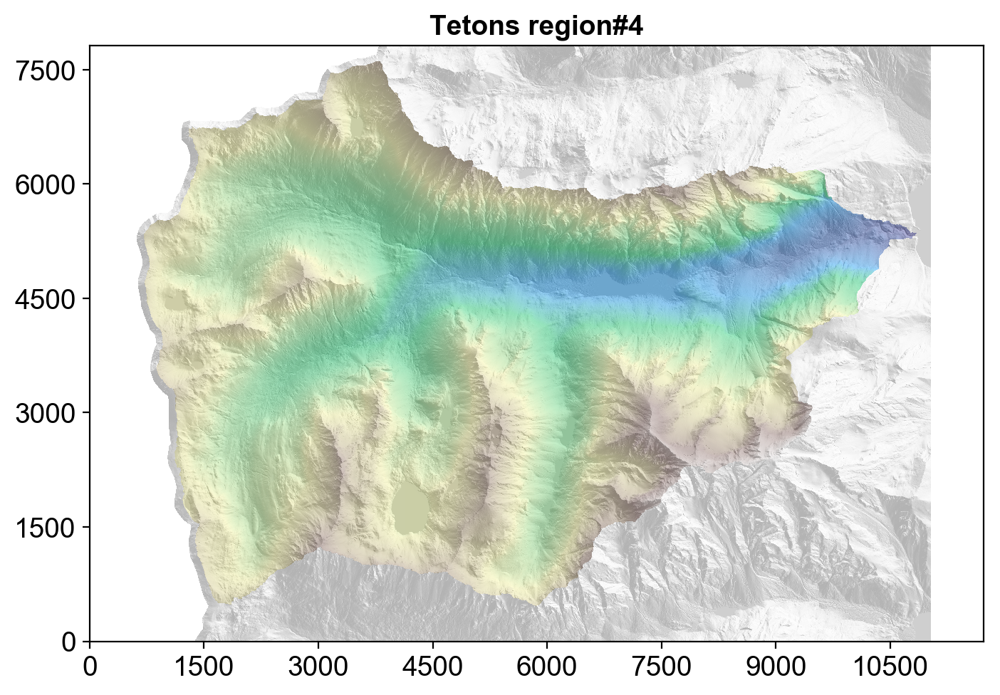

In [5]:
sl.plot.plot_roi_shaded_relief(interp_method='none')

## Preprocess DTM (fix loops etc)

In [6]:
%time sl.preprocess.do()


**Preprocess begin**
Precondition gradient vector field by fixing loops & blockages
Finding blockages...found 14225...done
Finding and fixing loops...
...done
Fixing blockages...
...done
Mask out bad uv pixels...done
**Preprocess end**

CPU times: user 31.4 s, sys: 741 ms, total: 32.1 s
Wall time: 32 s


## Trace streamlines

In [7]:
%autosave 0
%time sl.trace.do()
%autosave 120

Autosave disabled

**Trace begin**
Integrating trajectories...
Generating seed points...shuffling...padding for 32 CL work items/group: 1000->1024...done
GPU/OpenCL device global memory limit for streamline trajectories: 3.6GB
GPU/OpenCL device memory required for streamline trajectories: 4MB => no need to chunkify
Total number of kernel instances: 1,024
Number of chunks = seed point array divisor: 1
Chunk size = number of kernel instances per chunk: 1,024
Downstream: downup=0 sgn(uv)=+1.0 chunk=0 seeds: 0+1000 => 1000
Seed point buffer size = 1000.0*8 bytes
0.0% 62.5% 100.0% 
Upstream:   downup=1 sgn(uv)=-1.0 chunk=0 seeds: 0+1000 => 1000
Seed point buffer size = 1000.0*8 bytes
0.0% 62.5% 100.0% 
Building streamlines compressed array
Streamlines actual array allocation:  size=2MB
Computing streamlines statistics
    downstream                           upstream                         
           min        mean          max       min        mean          max
l   736.626404  999.85589

Autosaving every 120 seconds


In [8]:
import pandas as pd
ddf=pd.DataFrame(sl.trace.traj_stats_df.loc['downstream'].T)
udf=pd.DataFrame(sl.trace.traj_stats_df.loc['upstream'].T)
ddf.style.format("{:.3g}").set_properties(**{'font-size':'140%'})\
    .set_caption('Downstreamline statistics:')
udf.style.format("{:.3g}").set_properties(**{'font-size':'140%'})\
    .set_caption('Upstreamline statistics:')

,min,mean,max
l,737,1e+03,1e+03
n,606,820,830
ds,1.21,1.22,1.24


,min,mean,max
l,4.23,849,1e+03
n,3,822,2e+03
ds,0.0858,1.14,1.98


Autosave disabled
Plotting all 1,000 down-streamlines
Progress: 1%...2%...3%...4%...5%...6%...7%...8%...9%...10%...11%...12%...13%...14%...15%...16%...17%...18%...19%...20%...21%...22%...23%...24%...25%...26%...27%...28%...29%...30%...31%...32%...33%...34%...35%...36%...37%...38%...39%...40%...41%...42%...43%...44%...45%...46%...47%...48%...49%...50%...51%...52%...53%...54%...55%...56%...57%...58%...59%...60%...61%...62%...63%...64%...65%...66%...67%...68%...69%...70%...71%...72%...73%...74%...75%...76%...77%...78%...79%...80%...81%...82%...83%...84%...85%...86%...87%...88%...89%...90%...91%...92%...93%...94%...95%...96%...97%...98%...99%...100%
Plotting all 1,000 up-streamlines
Progress: 1%...2%...3%...4%...5%...6%...7%...8%...9%...10%...11%...12%...13%...14%...15%...16%...17%...18%...19%...20%...21%...22%...23%...24%...25%...26%...27%...28%...29%...30%...31%...32%...33%...34%...35%...36%...37%...38%...39%...40%...41%...42%...43%...44%...45%...46%...47%...48%...49%...50%...51%...52%..

Autosaving every 120 seconds


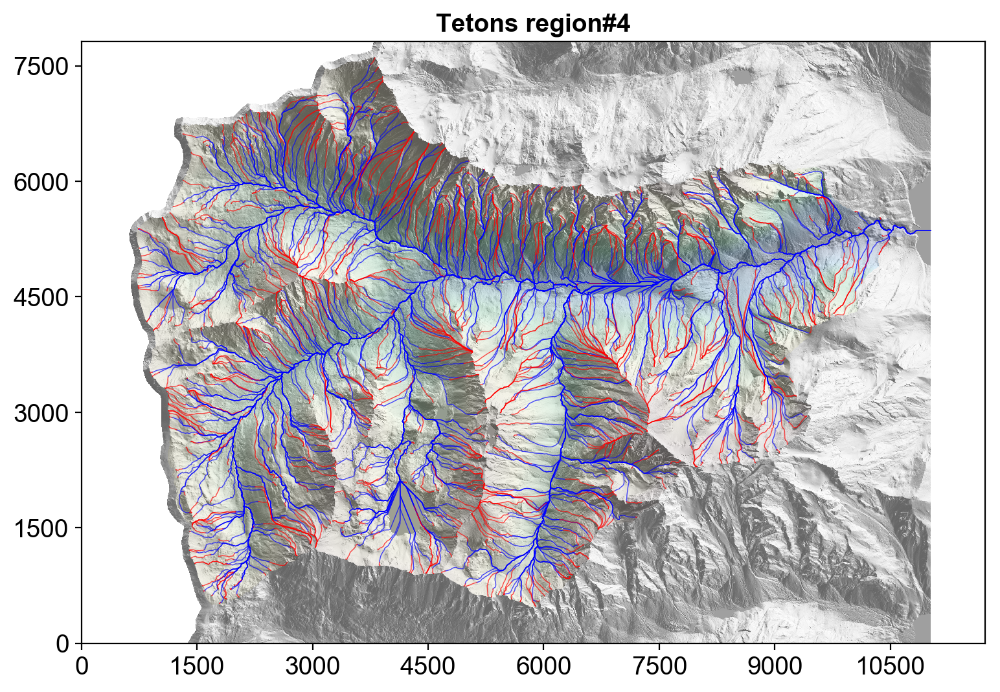

In [9]:
%autosave 0
sl.plot.plot_streamlines(window_size_factor=3)
%autosave 120

## Viz streamline flow concentrations

Recording figure "dsla"
Recording figure "dslt"


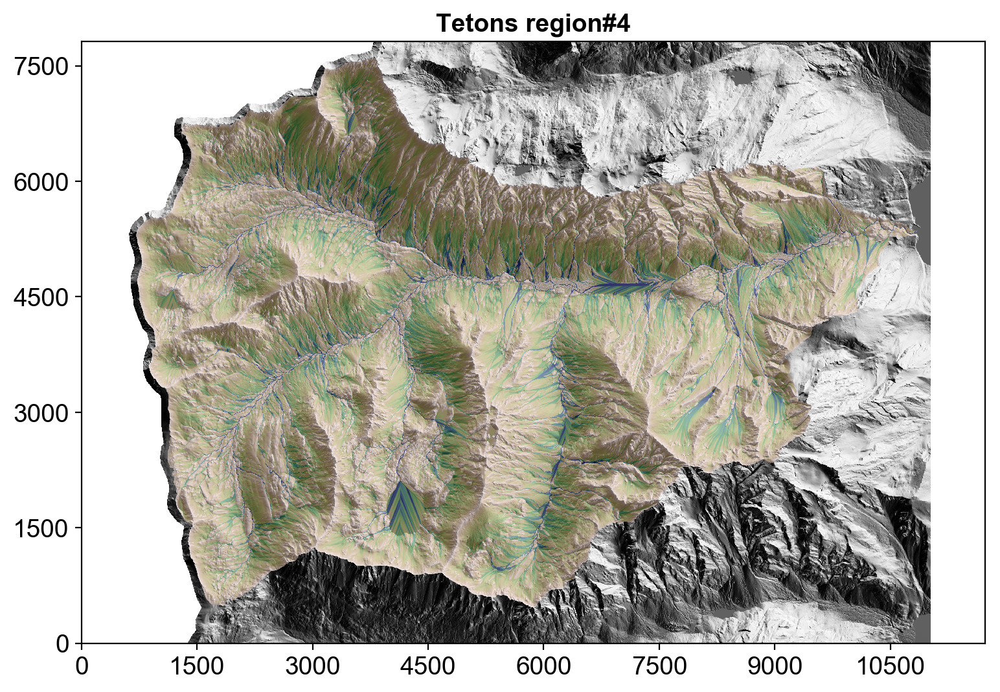

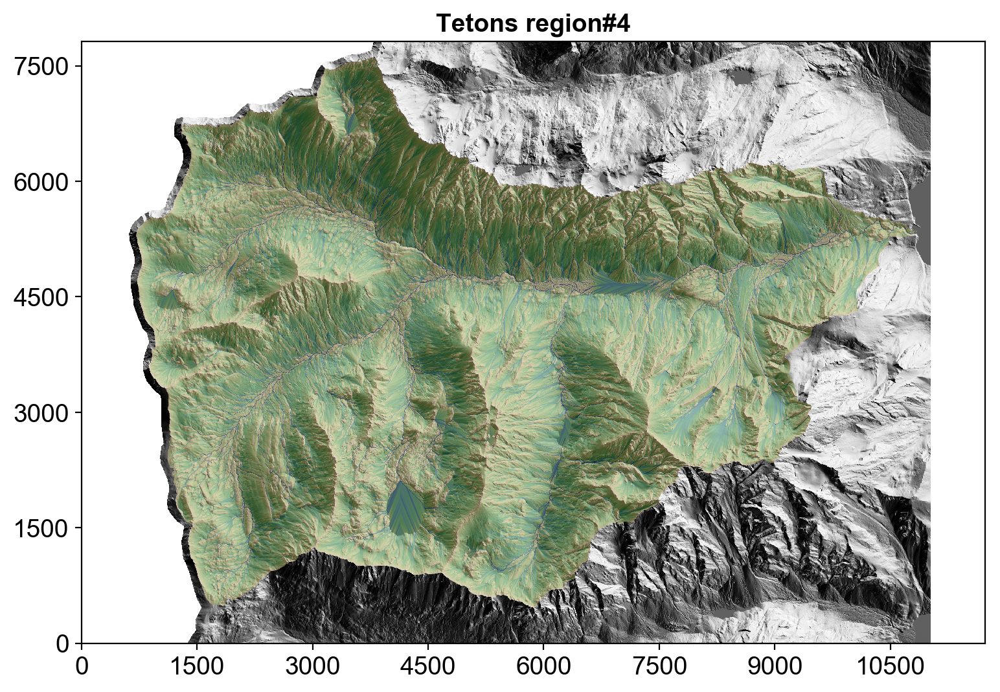

In [10]:
sl.plot.plot_flow_maps(window_size_factor=3)

## Analyze streamline distributions

In [11]:
# sl.analysis.do()

In [12]:
# sl.plot.plot_distributions()

## Map channels, segments & hillslope lengths

In [13]:
# sl.analysis.search_cdf_min=0.9
# sl.analysis.search_cdf_max=1

In [14]:
# sl.mapping.coarse_segmentation_threshold=100
# sl.mapping.coarse_channel_threshold=100
# sl.mapping.midslope_filter_sigma = 80
# sl.mapping.ridge_filter_sigma = 20
# sl.mapping.ridge_threshold = 0.4
sl.mapping.pass1()


**Pass#1 begin**
Midslopes...done
Ridges...done
Channels...done
Connecting channel pixels...
...done
Thinning channels...skeletonizing...done
Mapping channel heads...
...done
Counting down channels...
...done
Flagging down channels...
...done
Labeling confluences...
...done
Flagging down channels...
...done
Flagging down channels...
...done
Flagging down channels...
...done
Segmenting channels...number of segments=8109
...done
Linking hillslopes...
...done
Segmenting hillslopes...
...done
Subsegmenting left & right flanks...number of subsegments=15927
...done
Prepare for mapping HSL from midslopes
**Pass#1 end**


In [15]:
# sl.mapping.pass2()

In [16]:
# sl.mapping.pass3()

## Viz channels & segments

Recording figure "channels"


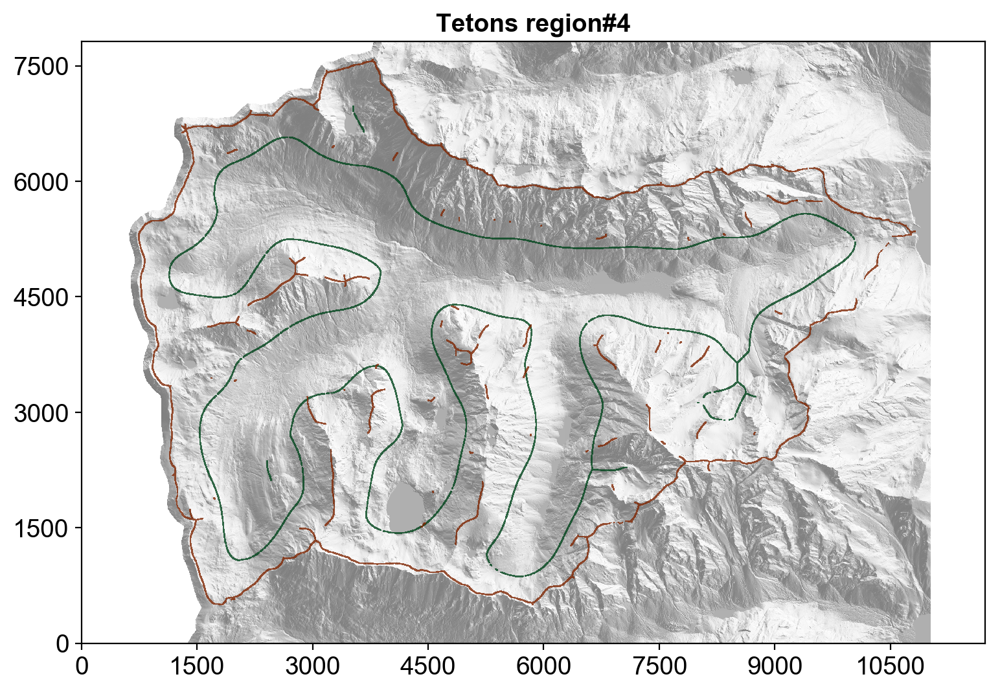

In [17]:
sl.plot.plot_channels(window_size_factor=3)
# sl.plot.plot_segments(window_size_factor=3)

## Elevation & slope distributions

In [18]:
sl.analysis.extra()

Recording figure "midslope_elevations_pdf"
Recording figure "slope_angles_pdf"


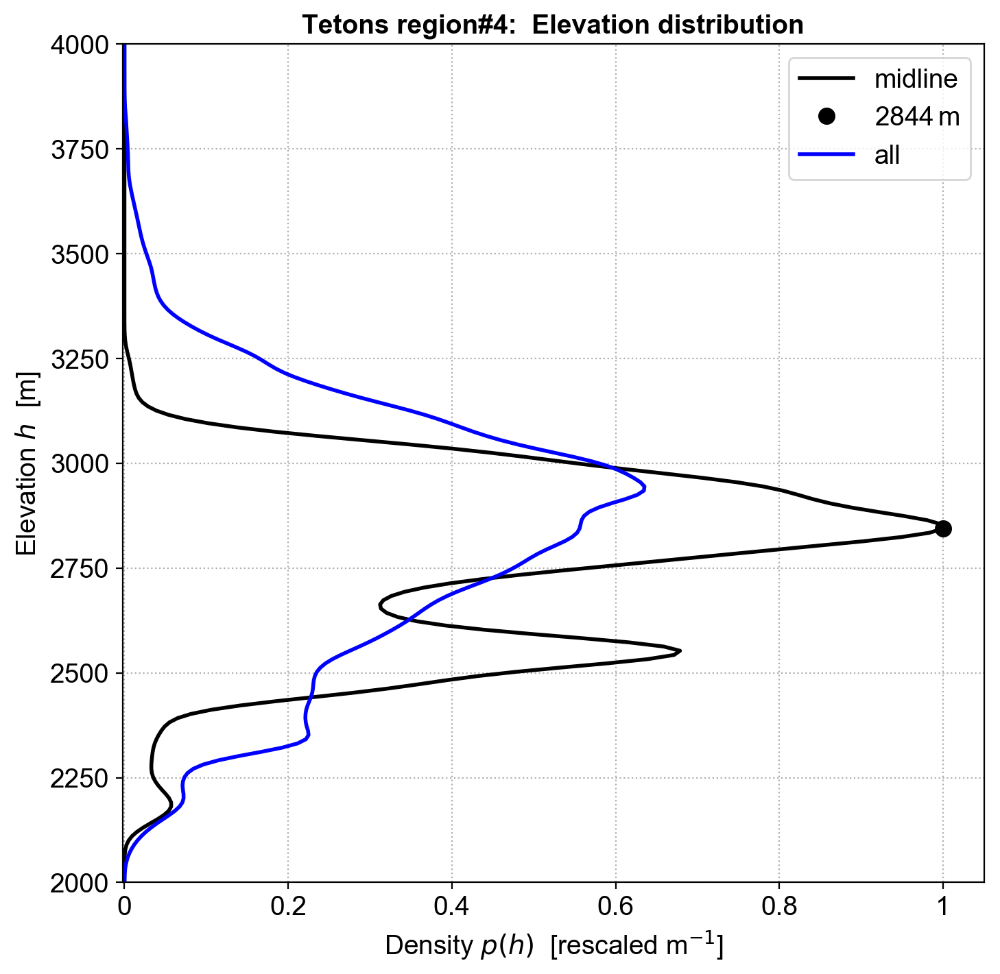

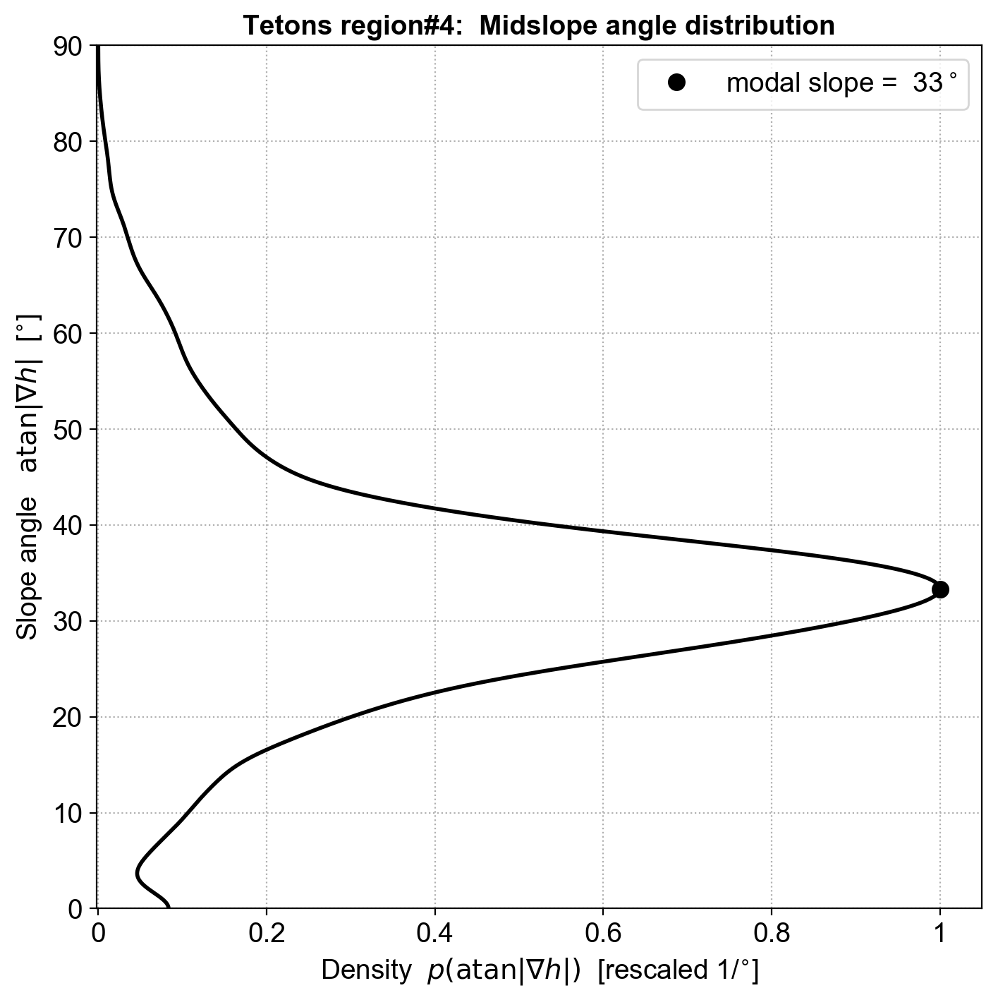

In [19]:
sl.plot.plot_midslope_elevations_pdf()
sl.plot.plot_slope_angles_pdf()

## Export plots

In [20]:
sl.plot.figs

{'roi_shaded_relief': <Figure size 810x810 with 1 Axes>,
 'streamlines': <Figure size 900x900 with 1 Axes>,
 'dsla': <Figure size 900x900 with 1 Axes>,
 'dslt': <Figure size 900x900 with 1 Axes>,
 'channels': <Figure size 900x900 with 1 Axes>,
 'midslope_elevations_pdf': <Figure size 810x810 with 1 Axes>,
 'slope_angles_pdf': <Figure size 810x810 with 1 Axes>}

In [21]:
sl.save.do(sl)


**Write results to files begin**
Saving analyses...
Writing to "/Users/colinstark/Science/slm_glacial_lidar/Tetons/ROI4/Analyses/Tetons_ROI4_smooth500m_results.json"
...done
Saving maps...
<class 'tuple'>
/Users/colinstark/Science/slm_glacial_lidar/Tetons/ROI4/Maps/Tetons_ROI4_smooth500m_dtm_mask.tif (3914, 2609)
/Users/colinstark/Science/slm_glacial_lidar/Tetons/ROI4/Maps/Tetons_ROI4_smooth500m_basin_mask.tif (3914, 2609)
/Users/colinstark/Science/slm_glacial_lidar/Tetons/ROI4/Maps/Tetons_ROI4_smooth500m_uv.tif (3914, 2609, 2)
/Users/colinstark/Science/slm_glacial_lidar/Tetons/ROI4/Maps/Tetons_ROI4_smooth500m_slope.tif (3914, 2609)
/Users/colinstark/Science/slm_glacial_lidar/Tetons/ROI4/Maps/Tetons_ROI4_smooth500m_mapping.tif (3914, 2609)
/Users/colinstark/Science/slm_glacial_lidar/Tetons/ROI4/Maps/Tetons_ROI4_smooth500m_coarse_subsegment.tif (3914, 2609)
/Users/colinstark/Science/slm_glacial_lidar/Tetons/ROI4/Maps/Tetons_ROI4_smooth500m_merged_coarse_mask.tif (3914, 2609)
/Users/col